In [109]:
import pandas as pd
import numpy as np

import seaborn as sns
sns.set(context='paper', style='darkgrid', rc={'figure.facecolor':'white'}, font_scale=1.2)

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression

from sklearn import metrics

from sklearn.metrics import confusion_matrix
import itertools

from sklearn.model_selection import GridSearchCV

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingClassifier

import xgboost as xgb

import pickle

In [110]:
X = pd.read_csv('training_set_values.csv', index_col = 0)

In [111]:
y = pd.read_csv('training_set_labels.csv', index_col = 0)

In [112]:
df = pd.concat([X, y], axis = 1)

In [ ]:
classes = ['functional', 'functional needs repair', 'non functional']

#### remove: wpt_name, date_recorded, region_code, recorded_by, scheme_name, extraction_type, payment_type, water_quality, quantity_group, source

#### possibly to remove: funder, long/lat, num_private, installer, subvillage

#### Maybe: district_code, lga, ward, scheme_management/management, extraction_type_group, management_group

#### Dummies: Basin, region, public_meeting, permit, extraction_type_class, payment, quality_group, quantity, source_type, source_class, waterpoint_type_group

#### Continuous: amount_tsh, gps_height, population, construction_year (look at 0's)

In [ ]:
df.drop(columns = ['wpt_name', 'date_recorded', 'region_code', 'recorded_by', 
                     'scheme_name', 'extraction_type', 'payment_type', 'water_quality', 
                     'quantity_group', 'source', 'waterpoint_type'], inplace = True)

In [ ]:
df2 = df.drop(columns = ['funder', 'longitude', 'latitude', 'num_private', 
                         'installer', 'subvillage'])

In [ ]:
df3 = df2.drop(columns = ['district_code', 'lga', 'ward', 'scheme_management', 'management', 
                          'extraction_type_group', 'management_group', 'construction_year'])

In [ ]:
df3.dropna(inplace = True)

## Making Dummies

In [ ]:
basin_dummies = pd.get_dummies(df3['basin'], prefix = 'basin_', drop_first = True)

region_dummies = pd.get_dummies(df3['region'], prefix = 'region_', drop_first = True)

extraction_dummies = pd.get_dummies(df3['extraction_type_class'], prefix = 'extraction_', 
                                    drop_first = True)

payment_dummies = pd.get_dummies(df3['payment'], prefix = 'payment_', drop_first = True)

quality_dummies = pd.get_dummies(df3['quality_group'], prefix = 'quality_', drop_first = True)

quantity_dummies = pd.get_dummies(df3['quantity'], prefix = 'quantity_', drop_first = True)

source_type_dummies = pd.get_dummies(df3['source_type'], prefix = 'source_type', 
                                     drop_first = True)

source_class_dummies = pd.get_dummies(df3['source_class'], prefix = 'source_class', 
                                      drop_first = True)

waterpoint_type_dummies = pd.get_dummies(df3['waterpoint_type_group'], prefix = 'waterpoint_type_',
                                       drop_first = True)

In [ ]:
permit_dict = {True: 1,
               False: 0}

df3[['permit', 'public_meeting']] = df3[['permit', 'public_meeting']].replace(permit_dict)

In [ ]:
status_dict = {'functional': 1, 
               'non functional': 0, 
               'functional needs repair': 2}

In [ ]:
df3 = pd.concat([df3, waterpoint_type_dummies, source_class_dummies, source_type_dummies,
                basin_dummies, region_dummies, extraction_dummies, payment_dummies,
                quality_dummies, quantity_dummies], axis = 1)

In [ ]:
df3.drop(columns = ['basin', 'region', 'extraction_type_class', 'payment', 'quality_group', 
                    'quantity', 'source_type', 'source_class', 'waterpoint_type_group'], inplace = True)

In [ ]:
df3.shape

In [ ]:
X3 = df3.drop(columns = ['status_group'], axis = 1)

In [ ]:
y3 = df3['status_group']

In [ ]:
y3.unique()

## Basic_Model

In [ ]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.25, random_state=23)

In [ ]:
scaler3 = StandardScaler()
scaler3.fit(X3_train)
X3_train = pd.DataFrame(data=scaler3.transform(X3_train), columns = X3.columns)
X3_test = pd.DataFrame(data=scaler3.transform(X3_test), columns = X3.columns)

## KNN Model (Basic Set #1)

In [ ]:
knn_df3 = KNeighborsClassifier()

In [ ]:
knn_df3.fit(X3_train, y3_train)

y_pred_knn3 = knn_df3.predict(X3_test)
y_train_knn3 = knn_df3.predict(X3_train)

In [ ]:
# checking accuracy
print('Test Accuracy score: ', accuracy_score(y3_test, y_pred_knn3))

# checking accuracy
print('Train Accuracy score: ', accuracy_score(y3_train, y_train_knn3))

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion Matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
plot_confusion_matrix(metrics.confusion_matrix(y3_test, y_pred_knn3), classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues)

## Random Forest (Best set #2)

In [ ]:
rfc_df3 = RandomForestClassifier(class_weight='balanced', criterion = 'entropy', max_depth = 16, 
                                 n_estimators = 200, random_state = 23, n_jobs = -1)

In [ ]:
rfc_df3.fit(X3_train, y3_train)

y_pred_rfc3 = rfc_df3.predict(X3_test)
y_train_rfc3 = rfc_df3.predict(X3_train)

In [ ]:
# checking accuracy
print('Test Accuracy score: ', accuracy_score(y3_test, y_pred_rfc3))

# checking accuracy
print('Train Accuracy score: ', accuracy_score(y3_train, y_train_rfc3))

### Random Forest Gridsearch 

In [ ]:
params_df3 = {'max_depth': [3, 6, 9, 12, 15], 'n_estimators' : [100, 200, 300, 400, 500], 
              'min_samples_leaf': [1, 2, 3], 'min_samples_split': [2, 4, 6], 
              'criterion': ['gini', 'entropy']} 

In [ ]:
grid_df3 = GridSearchCV(rfc_df3, params_df3, verbose = 1, n_jobs = -1, cv = 5, scoring = 'accuracy')

grid_df3.fit(X3_train, y3_train)

In [ ]:
grid_df3.best_estimator_

## XGB Model 

In [ ]:
xgb_df3 = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=10,
              min_child_weight=3, monotone_constraints='()',
              n_estimators=500, n_jobs=-1, num_parallel_tree=1,
              objective='multi:softprob', random_state=23, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=1)

In [ ]:
xgb_df3.fit(X3_train, y3_train)

y_pred_xgb3 = xgb_df3.predict(X3_test)

y_train_xgb3 = xgb_df3.predict(X3_train)

In [ ]:
# checking accuracy
print('Test Accuracy score: ', accuracy_score(y3_test, y_pred_xgb3))

# checking accuracy
print('Train Accuracy score: ', accuracy_score(y3_train, y_train_xgb3))

In [ ]:
pd.DataFrame(xgb_df3.feature_importances_).plot.bar()

## XGB Gridsearch

In [ ]:
param_xgb = {'max_depth' : [4, 6, 8, 10], 'learning_rate' : [.01, .05, .1, .2], 
             'n_estimators' : [100, 250, 500], 'min_child_weight' : [1,3,5]}

In [ ]:
grid_xgb = GridSearchCV(xgb_df3, param_xgb, n_jobs = -1, cv = 3, verbose = 1)

grid_xgb.fit(X3_train, y3_train)

In [ ]:
grid_xgb.best_estimator_

In [ ]:
y_pred_xgb_grid = grid_xgb.best_estimator_.predict(X3_test)

In [ ]:
# checking accuracy
print('Test Accuracy score: ', accuracy_score(y3_test, y_pred_xgb_grid))

# checking accuracy
print('Train Accuracy score: ', accuracy_score(y3_train, y_train_xgb3))

In [ ]:
plot_confusion_matrix(metrics.confusion_matrix(y3_test, y_pred_xgb_grid), classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues)

In [ ]:
test_df = pd.read_csv('Test_set_values.csv', index_col = 0)

In [ ]:
basin_dummies = pd.get_dummies(test_df['basin'], prefix = 'basin_', drop_first = True)

region_dummies = pd.get_dummies(test_df['region'], prefix = 'region_', drop_first = True)

extraction_dummies = pd.get_dummies(test_df['extraction_type_class'], prefix = 'extraction_', 
                                    drop_first = True)

payment_dummies = pd.get_dummies(test_df['payment'], prefix = 'payment_', drop_first = True)

quality_dummies = pd.get_dummies(test_df['quality_group'], prefix = 'quality_', drop_first = True)

quantity_dummies = pd.get_dummies(test_df['quantity'], prefix = 'quantity_', drop_first = True)

source_type_dummies = pd.get_dummies(test_df['source_type'], prefix = 'source_type', 
                                     drop_first = True)

source_class_dummies = pd.get_dummies(test_df['source_class'], prefix = 'source_class', 
                                      drop_first = True)

waterpoint_type_dummies = pd.get_dummies(test_df['waterpoint_type_group'], prefix = 'waterpoint_type_',
                                       drop_first = True)

permit_dict = {True: 1,
               False: 0}

test_df[['permit', 'public_meeting']] = test_df[['permit', 'public_meeting']].replace(permit_dict)

test_df = pd.concat([test_df, waterpoint_type_dummies, source_class_dummies, source_type_dummies,
                basin_dummies, region_dummies, extraction_dummies, payment_dummies,
                quality_dummies, quantity_dummies], axis = 1)

test_df.drop(columns = ['wpt_name', 'date_recorded', 'region_code', 'recorded_by', 
                   'scheme_name', 'extraction_type', 'payment_type', 'water_quality', 
                   'quantity_group', 'source', 'waterpoint_type', 'funder', 'longitude', 
                   'latitude', 'num_private', 'installer', 'subvillage', 'district_code', 
                   'lga', 'ward', 'scheme_management', 'management', 'extraction_type_group', 
                   'management_group', 'construction_year', 'basin', 'region', 
                   'extraction_type_class', 'payment', 'quality_group', 'quantity', 
                   'source_type', 'source_class', 'waterpoint_type_group'], inplace = True)



In [ ]:
id_df = test_df.reset_index()['id']

In [ ]:
test_df = pd.DataFrame(data=scaler3.transform(test_df), columns = test_df.columns)

In [ ]:
test_results = xgb_df3.predict(test_df)

In [ ]:
testing_results = pd.DataFrame(test_results, columns = ['status_group'])

In [ ]:
test_labels = pd.concat([id_df, testing_results], axis = 1)

In [ ]:
test_labels = test_labels.set_index('id')

In [ ]:
test_labels

In [ ]:
test_labels.to_csv('testing_results.csv')

### Trying Geographical Visualizations

In [72]:
df[df['region'] == 'Mtwara']['status_group'].value_counts()

non functional             1080
functional                  524
functional needs repair     126
Name: status_group, dtype: int64

In [5]:
import folium

In [59]:
lat = [x for x in df['latitude'] if x != -2e-08]
long = [x for x in df['longitude'] if x != 0]

lat_long_total = [(lat[i], long[i]) for i in range(len(lat))]

In [57]:
df_f = df[df['status_group'] == 'functional']
df_nf = df[df['status_group'] == 'non functional']
df_fnr = df[df['status_group'] == 'functional needs repair']

In [58]:
lat_f = [x for x in df_f['latitude'] if x != -2e-08]
long_f = [x for x in df_f['longitude'] if x != 0]

lat_nf = [x for x in df_nf['latitude'] if x != -2e-08]
long_nf = [x for x in df_nf['longitude'] if x != 0]

lat_fnr = [x for x in df_fnr['latitude'] if x != -2e-08]
long_fnr = [x for x in df_fnr['longitude'] if x != 0]

lat_long_f = [(lat_f[i], long_f[i]) for i in range(len(lat_f))]
lat_long_nf = [(lat_nf[i], long_nf[i]) for i in range(len(lat_nf))]
lat_long_fnr = [(lat_fnr[i], long_fnr[i]) for i in range(len(lat_fnr))]

In [182]:
pop_f =  [x for x in df_f['population']]
pop_nf =  [x for x in df_nf['population']]
pop_fnr =  [x for x in df_fnr['population']]

In [206]:
mapit = folium.Map(location=[np.mean(lat), np.mean(long)], zoom_start=6)
plugins.Fullscreen(position='topright', force_separate_button=True).add_to(mapit)
for coord in lat_long_nf[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='red', radius=1).add_to(mapit)
for coord in lat_long_f[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='blue', radius=1).add_to(mapit)
for coord in lat_long_fnr[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.7, color='green', radius=1).add_to( mapit ) 

    
mapit

## Attempting altitude map with matplotlib and folium

In [123]:
df = df[df['longitude'] != 0]
df.reset_index(inplace = True)

ValueError: cannot insert level_0, already exists

/Users/antoniohila/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


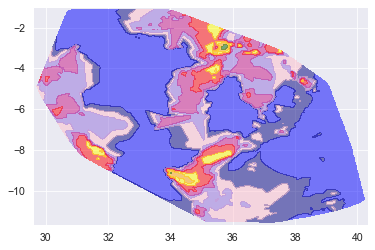

In [176]:
import folium
import branca
from folium import plugins
from scipy.interpolate import griddata
import geojsoncontour
import scipy as sp
import scipy.ndimage

%matplotlib inline
# Read the digital elevation  model in longitude, latitude and elevation format.

# Set all negative elevations to zero to show that they will be under the mean sea level of zero
for i in range(0,len(df)):
    if df['gps_height'][i] <= 0.:
        df['gps_height'][i] = 0.
        
# Setup minimum and maximum values for the contour lines
vmin = df['gps_height'].min() 
vmax = df['gps_height'].max()

# Setup colormap
colors = ['blue', 'navy', 'pink', 'mediumpurple', 'mediumvioletred',
         'red','yellow','orange', 'darkgreen']
levels = len(colors)
cm     = branca.colormap.LinearColormap(colors, vmin=vmin, vmax=vmax).to_step(levels)

# Convertion from dataframe to array
x = np.asarray(df.longitude.tolist())
y = np.asarray(df.latitude.tolist())
z = np.asarray(df.gps_height.tolist()) 
# Make a grid
x_arr          = np.linspace(np.min(x), np.max(x), 500)
y_arr          = np.linspace(np.min(y), np.max(y), 500)
x_mesh, y_mesh = np.meshgrid(x_arr, y_arr)
 
# Grid the elevation (Edited on March 30th, 2020)
z_mesh = griddata((x, y), z, (x_mesh, y_mesh), method='linear')
 
# Use Gaussian filter to smoothen the contour
sigma = [1,1]
z_mesh = sp.ndimage.filters.gaussian_filter(z_mesh, sigma, mode='constant')
 
# Create the contour
contourf = plt.contourf(x_mesh, y_mesh, z_mesh, levels, alpha=0.5, colors=colors, linestyles='None', vmin=vmin, vmax=vmax)

In [177]:
# Convert matplotlib contourf to geojson
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contourf,
    min_angle_deg=3.0,
    ndigits=5,
    stroke_width=1,
    fill_opacity=0.1)
 
# Set up the map placeholdder
geomap1 = folium.Map([df.latitude.mean(), df.longitude.mean()], zoom_start=6, tiles="OpenStreetMap")
# Plot the contour on Folium map
folium.GeoJson(
    geojson,
    style_function=lambda x: {
        'color':     x['properties']['stroke'],
        'weight':    x['properties']['stroke-width'],
        'fillColor': x['properties']['fill'],
        'opacity':   0.5,
    }).add_to(geomap1)
 
# Add the colormap to the folium map for legend
cm.caption = 'Elevation'
geomap1.add_child(cm)
 
# Add the legend to the map
plugins.Fullscreen(position='topright', force_separate_button=True).add_to(geomap1)


for coord in lat_long_nf[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='red', radius=1).add_to(geomap1)
for coord in lat_long_f[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='blue', radius=1).add_to(geomap1)
for coord in lat_long_fnr[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='green', radius=1).add_to(geomap1)

    
geomap1

